In [17]:
# Python libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
from mpl_toolkits.mplot3d import Axes3D  # Importing the 3D plotting module
import matplotlib.colors as mcolors
from matplotlib.colors import TwoSlopeNorm

import numpy.linalg as la

# Transformers libraries
import torch
import transformers
from transformers import AutoTokenizer, AutoModelForCausalLM

from my_functions import apply_TSNE, surface_reconstruction, svd, metric_comparisons, svd_and_pca

In [3]:
model_id = 'openai-community/gpt2'
tokenizer = AutoTokenizer.from_pretrained(model_id)
model = AutoModelForCausalLM.from_pretrained(model_id, output_attentions=True)

df = pd.read_pickle("/mnt/DATA/output/word_to_vector.pkl")

In [4]:
FFNN = decoder = model.transformer.h[0].mlp

first_layer_weight   = FFNN.c_fc.weight.detach().numpy()
first_layer_bias     = FFNN.c_fc.bias.detach().numpy()
second_layer_weight  = FFNN.c_proj.weight.detach().numpy()
second_layer_bias    = FFNN.c_proj.bias.detach().numpy()

print(FFNN)
print("First  layer shape: ", first_layer_weight.shape)
print("Second layer shape: ", second_layer_weight.shape)

GPT2MLP(
  (c_fc): Conv1D()
  (c_proj): Conv1D()
  (act): NewGELUActivation()
  (dropout): Dropout(p=0.1, inplace=False)
)
First  layer shape:  (768, 3072)
Second layer shape:  (3072, 768)


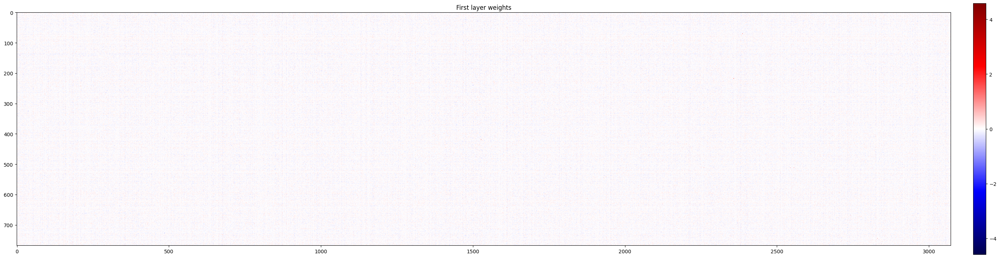

In [5]:
plt.figure(1, (40,20))
norm = TwoSlopeNorm(vmin=-np.abs(first_layer_weight).max(), vmax=np.abs(first_layer_weight).max(), vcenter=0)
plt.imshow(first_layer_weight, cmap='seismic', norm=norm)
plt.colorbar(shrink=0.45, pad=0.02)
plt.title('First layer weights')
plt.show()

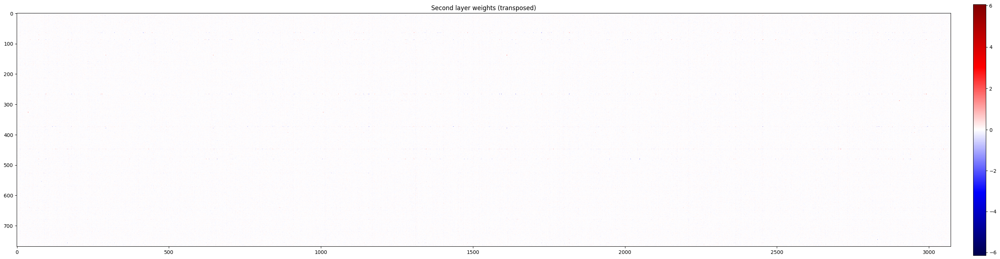

In [6]:
plt.figure(1, (40,20))
norm = TwoSlopeNorm(vmin=np.min(second_layer_weight), vmax=np.max(second_layer_weight), vcenter=0)
plt.imshow(second_layer_weight.T, cmap='seismic', norm=norm)
plt.colorbar(shrink=0.45, pad=0.02)
plt.title('Second layer weights (transposed)')
plt.show()

Loading the output of the FFNN

In [8]:
first_hidden_layer  = torch.load("/mnt/DATA/output/decoder/decoder_1/FirstLayerNN.pt").detach().numpy()[0]
second_hidden_layer = torch.load("/mnt/DATA/output/decoder/decoder_1/SecondLayerNN.pt").detach().numpy()[0]

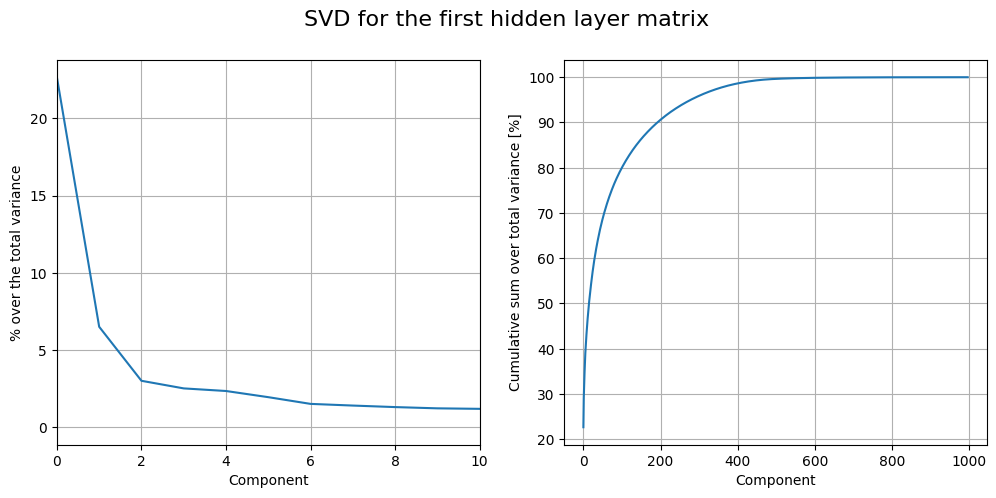

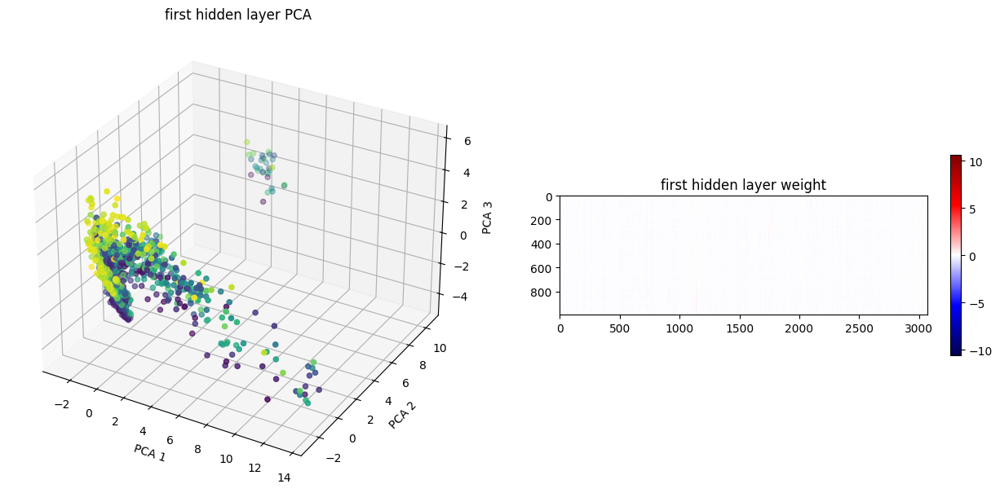

In [18]:
svd_and_pca(first_hidden_layer, 'first hidden layer')

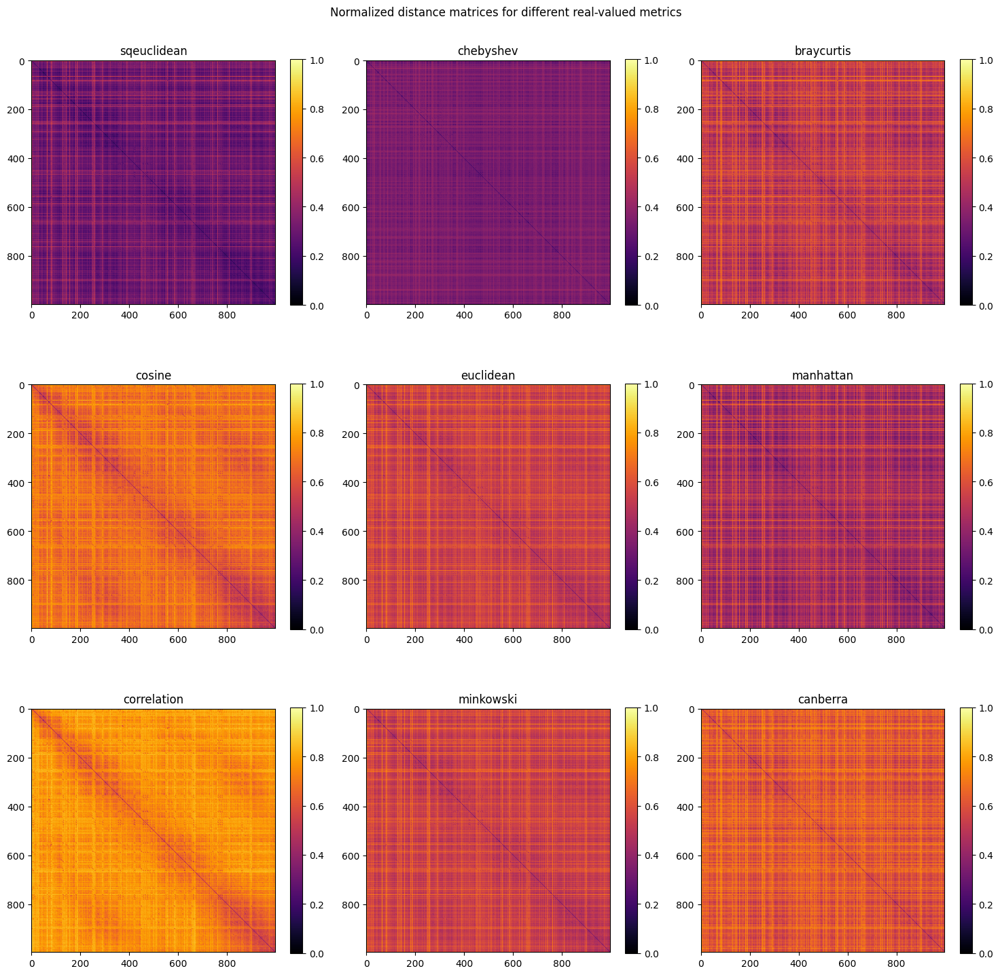

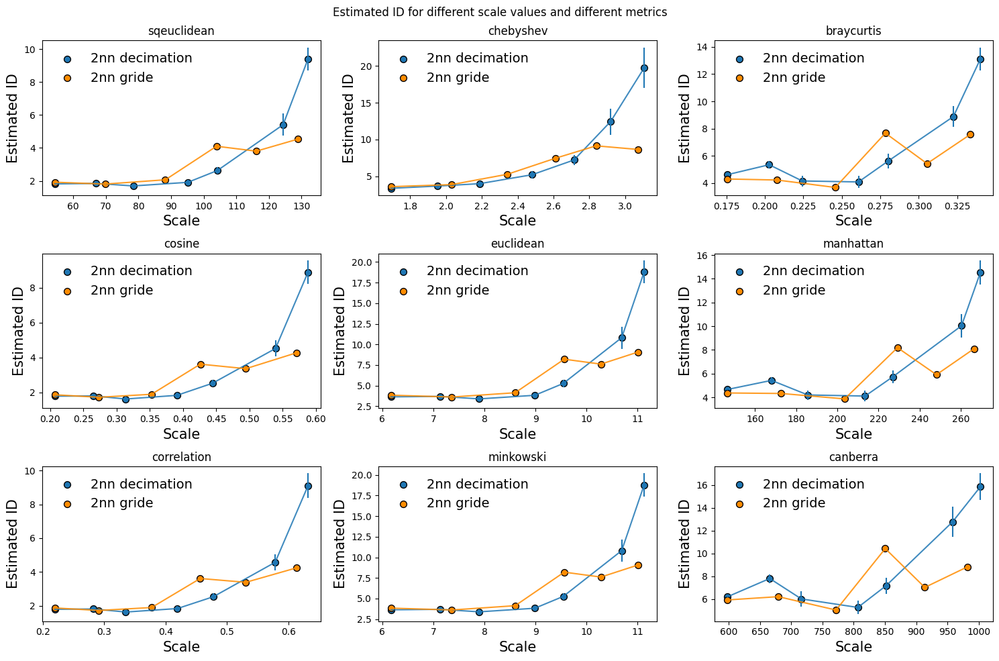

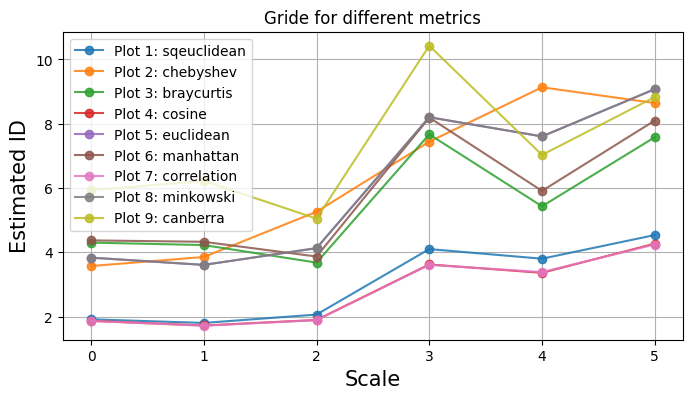

In [11]:
metric_comparisons(first_hidden_layer)

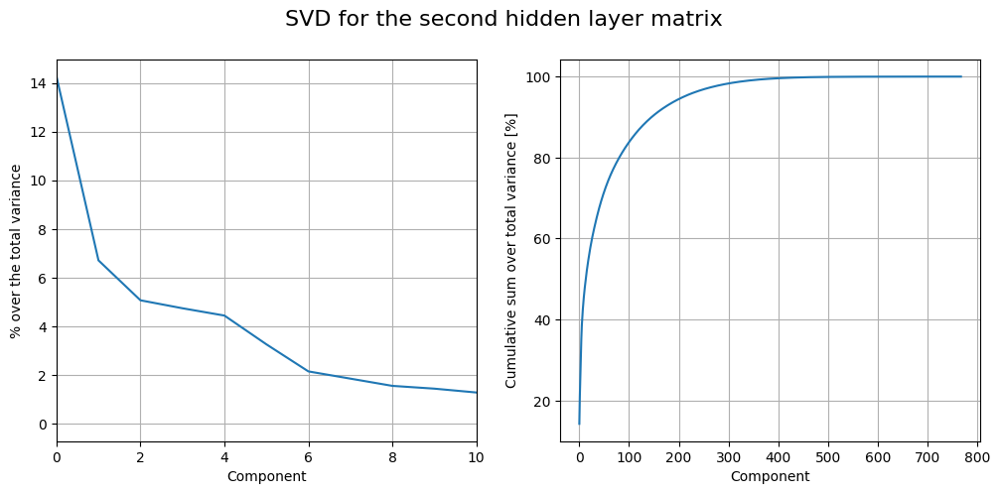

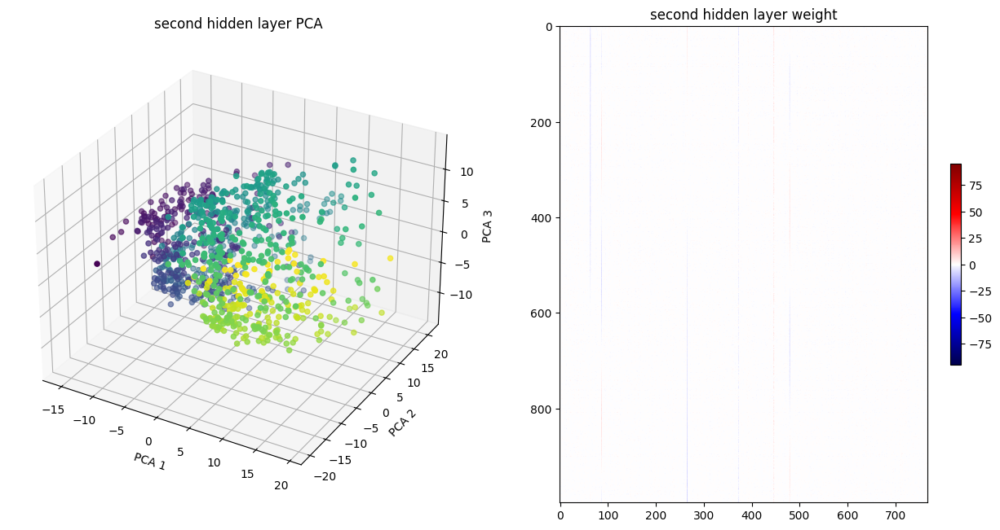

In [19]:
svd_and_pca(second_hidden_layer, 'second hidden layer')

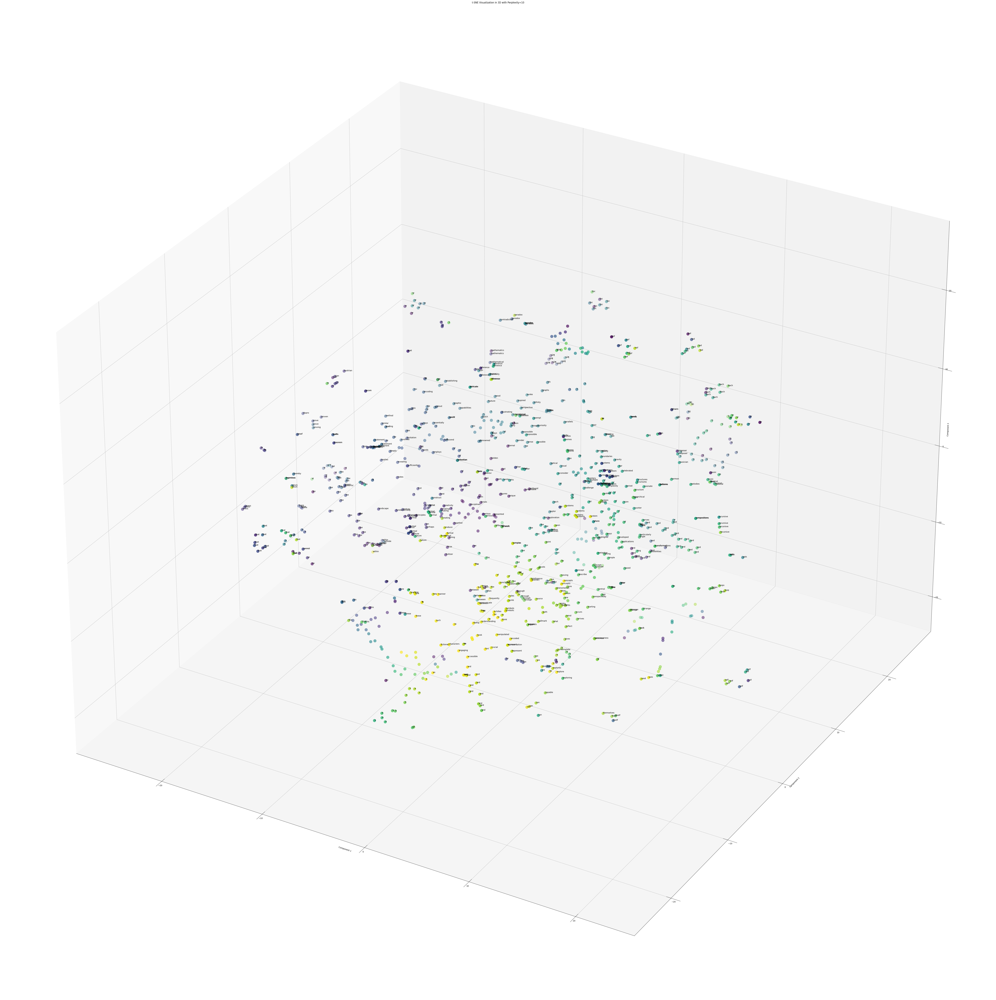

In [14]:
apply_TSNE(df, second_hidden_layer)

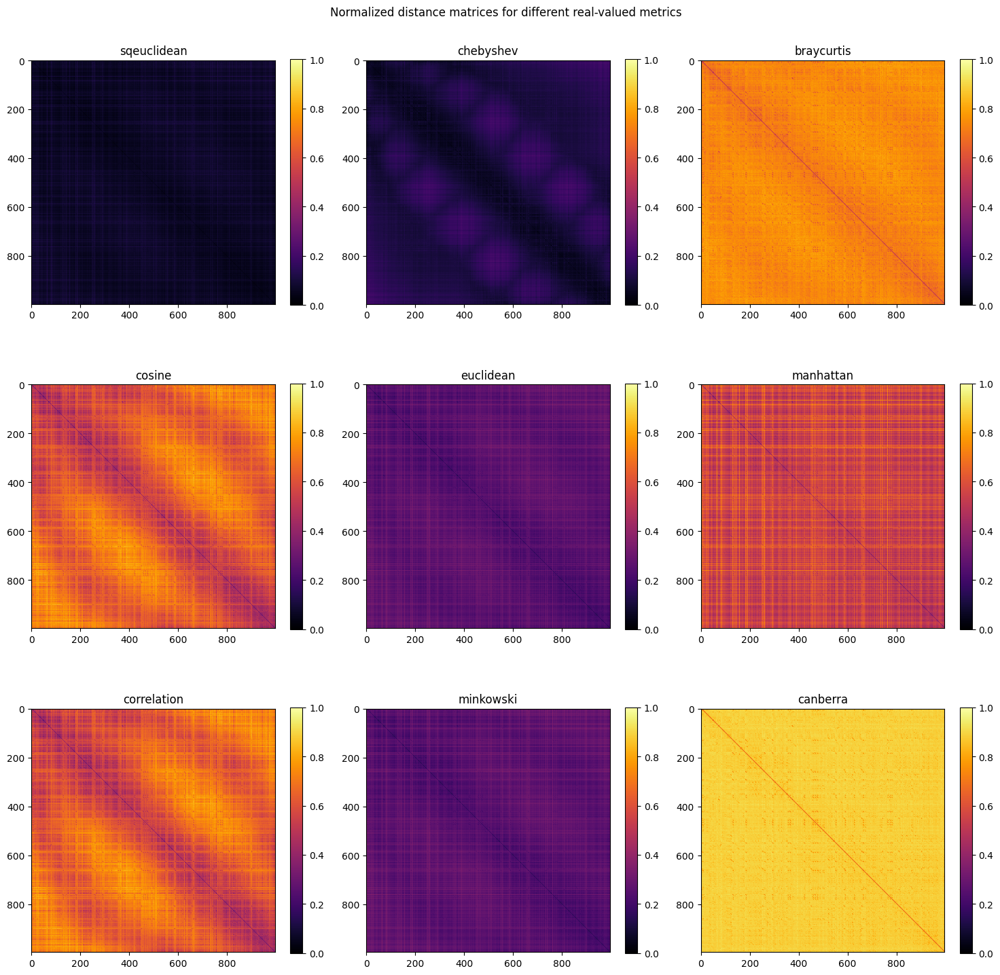

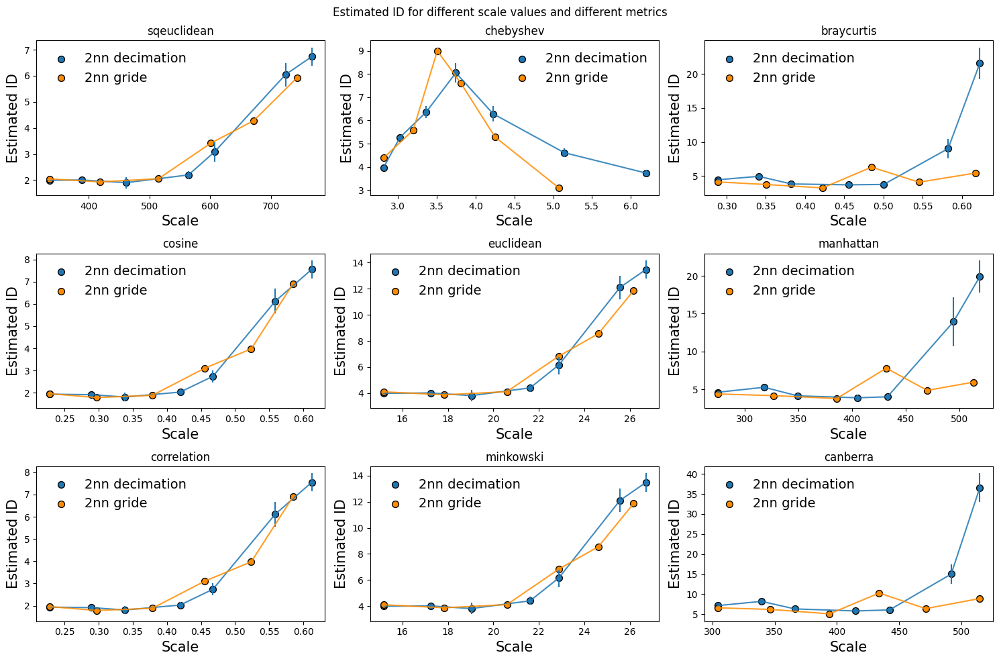

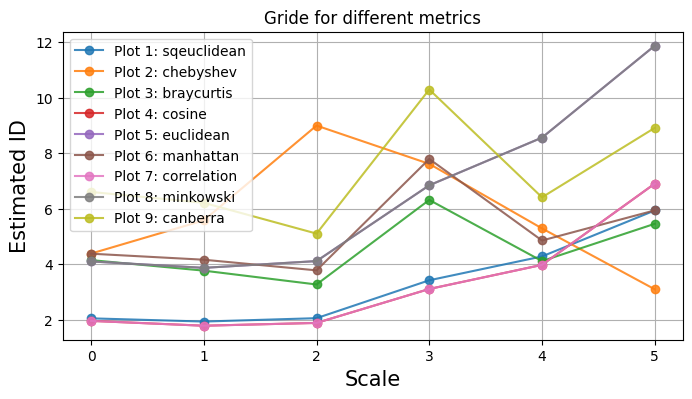

In [15]:
metric_comparisons(second_hidden_layer)